# Домашнее задание №3

Задание присылать на почту **aleksartmonov@gmail.com** в форматах *.ipynb* и отрендеренный результат в *.html*

В теме письма указать **AU2018 HW3 <Фамилия Имя>**

soft deadline: 18.03.2018T23:59:00+0300

hard deadline: 25.03.2018T23:59:00+0300


### Контуры, фильтрация, морфология

In [1]:
import cv2
import math
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

from pathlib import Path
from itertools import combinations
from scipy.spatial import distance

%matplotlib inline


def show(img, size=10, **kwargs):
    plt.figure(figsize=(size, size))
    ax = plt.axes([0,0,1,1], frameon=False)
    ax.set_axis_off()
    plt.imshow(img, **kwargs)

#### Основные методы

In [2]:
def read_BGR(path):
    return cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)


def inv(img):
    return 255 - img


def mask3d(mask):
    return np.repeat(mask.reshape(mask.shape + (1,)), 3, axis=2)


def img2mask(img):
    return img == 255


def img2mask3d(img):
    return mask3d(img2mask(img))


def img2bin(img, threshold):
    img = img.copy()
    img[img < threshold] = 0
    img[img >= threshold] = 255
    return img


def morph(mode, img, kernel, threshold):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel)
    img = cv2.morphologyEx(img, mode, kernel)
    return img2bin(img, threshold)


def morph_open(img, kernel, threshold=128):
    return morph(cv2.MORPH_OPEN, img, kernel, threshold)


def morph_close(img, kernel, threshold=128):
    return morph(cv2.MORPH_CLOSE, img, kernel, threshold)

**1. (5 баллов)** Выделите в изображении $table.jpg$ границы таблицы с использованием морфологических операций. Результатом обработки должно быть изображение, в котором удален весь текст и оставлены только границы таблицы

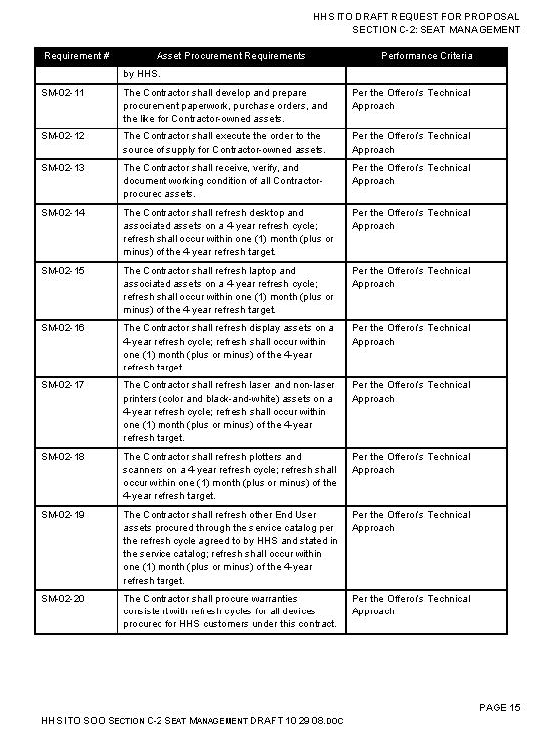

In [3]:
table = cv2.cvtColor(cv2.imread('table.jpg'), cv2.COLOR_BGR2GRAY)
table = table / 255
show(table, size=10, cmap='gray')

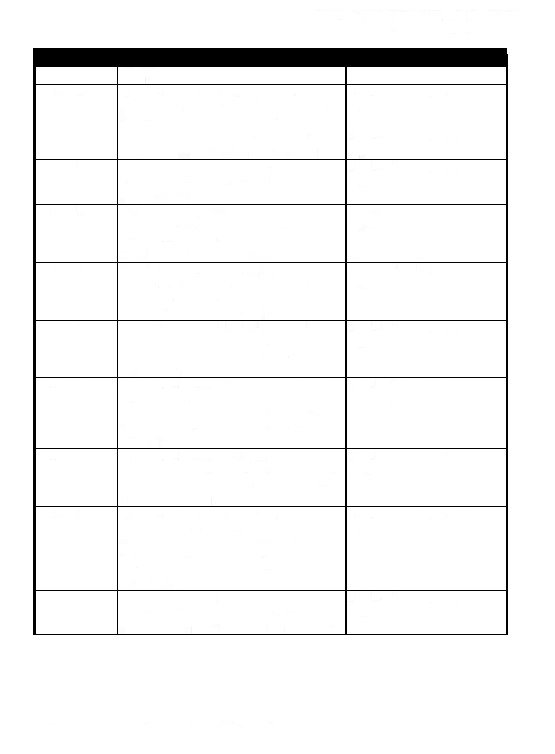

In [4]:
def remove_content(img):
    img = 1.0 - img
    kernel_v = np.ones((2,1), np.uint8)
    img_v = cv2.erode(img, kernel_v, iterations = 7)
    kernel_h = np.ones((2,3), np.uint8)
    img_h = cv2.erode(img, kernel_h, iterations = 1)
    return (1 - (img_v + img_h) / 2)
            
    
def remove_header(img):
    kernel = np.ones((7, 7), np.uint8)
    img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
    img[img < 0.9] = 0
    return img


show(remove_header(remove_content(table)), size=10, cmap='gray')

**2. (5 баллов) ** Отделите монеты от фона на изображении $coins\_1.jpg$, отсортируйте монеты по убыванию размера. Сгенерируйте результирующее изображение с цветной разметкой областей, соответствующих монетам на исходном изображении: на черном фоне должны быть выделены разными цветами области, соответствующие монетам. В центре каждой выделенной области разместите порядковый номер монеты в соответствии с сортировкой монет по размеру (в центре области, соответствующей самой большой монете, должно стоять число 1)

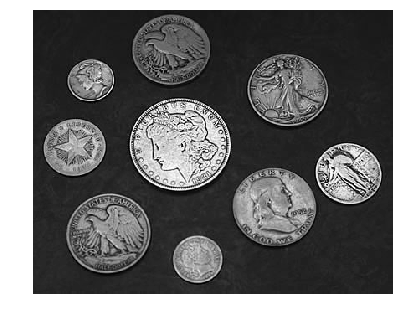

In [5]:
coins_gray = cv2.cvtColor(cv2.imread('coins_1.jpg'), cv2.COLOR_BGR2GRAY)
show(coins_gray, size=5, cmap='gray')

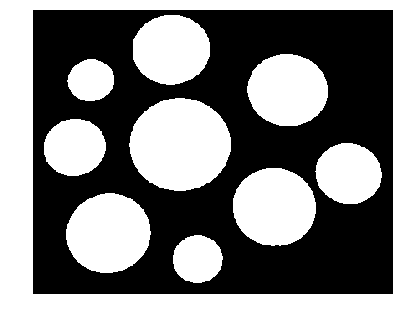

In [6]:
coins_bin = morph_close(coins_gray, kernel=(7, 7), threshold=70)
show(coins_bin, size=5, cmap='gray')

In [7]:
_, contours, hierarchy = cv2.findContours(coins_bin, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours = sorted(contours, key=lambda it: cv2.contourArea(it), reverse=True)

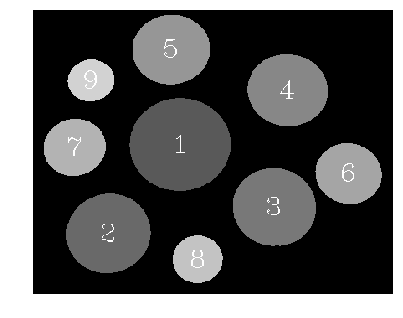

In [8]:
def get_center(contour):
    M = cv2.moments(contour)
    cX = int(M['m10'] / M['m00'])
    cY = int(M['m01'] / M['m00'])
    return (cX - 10, cY + 10)
    
    
result = np.zeros(coins_bin.shape)

for i, c in enumerate(contours):
    cv2.fillPoly(result, pts=[c], color=90 + i * 15)
    cv2.putText(result, str(i + 1), get_center(c), 3, 1, 255)
    
show(result, size=5, cmap='gray')

**3. (5 баллов)** Отделите монеты от текста на изображении $coins\_2.jpg.$ Сгене- рируйте по входному изображению два изображения: на одном должны остаться только монеты, весь текст должен быть удален; на втором изображении должен остаться только текст, все монеты должны быть удалены.

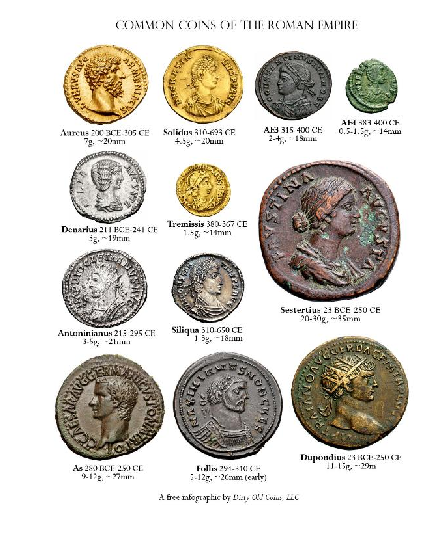

In [9]:
coins = read_BGR('coins_2.jpg')
coins_gray = cv2.cvtColor(coins, cv2.COLOR_RGB2GRAY)
show(coins, size=7)

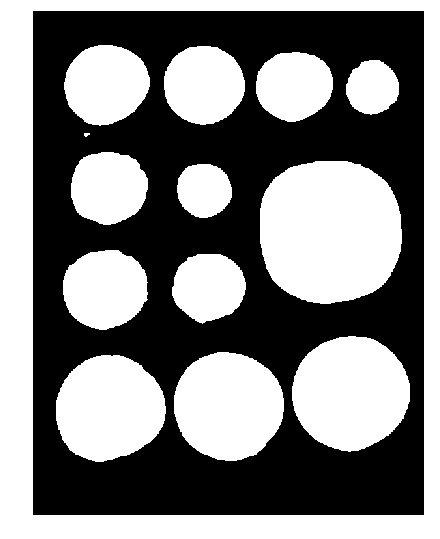

In [10]:
coins_bin = morph_open(inv(coins_gray), kernel=(6, 6), threshold=11)
coins_bin = morph_close(coins_bin, kernel=(12, 12))
show(coins_bin, size=7, cmap='gray')

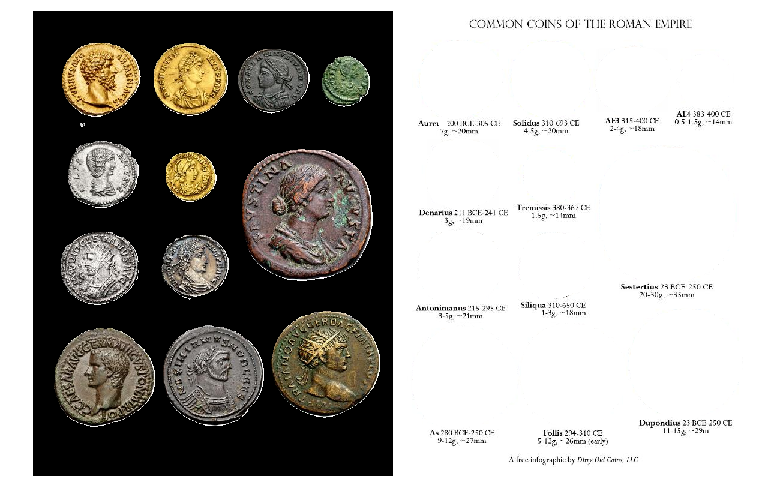

In [11]:
coins_clear = coins * img2mask3d(coins_bin)

coins_bin_ = cv2.dilate(coins_bin, np.ones((7, 7), np.uint8))
coins_text = coins.copy()
coins_text[img2mask3d(coins_bin_)] = 255

show(np.hstack((coins_clear, coins_text)))

**4. (10 баллов) ** Для каждого из зашумленных изображений $coins\_noize\_1.jpg$, $coins\_noize\_2.jpg$, $coins\_noize\_3.jpg$: выделите целые монеты, сгруппируйте их по размеру и посчитайте число монет в каждой группе. На выходе программа должна выдавать полученное число групп монет, средний размер монеты для каждой группы и число монет в каждой группе, а также изображение, визуализирующее результат. На данном изображении на черном фоне должны быть цветом выделены области, соответствующие монетам. Монеты, принадлежащие одной группе, должны быть обозначены одним и тем же цветом. 

Это творческое задание, можно использовать функции типа *HoughCircles, fitEllipse* и тд. 

In [12]:
COLORS = [(255, 0, 0), 
          (0, 255, 0), 
          (0, 0, 255), 
          (0, 204, 204), 
          (153, 51, 255), 
          (229, 204, 255), 
          (255, 255, 102),
          (255, 178, 102)]


def is_coin_inside(coin, shape):
    x, y, r = coin
    h, w = shape
    return min(abs(x), abs(w - x), abs(y), abs(h - y)) > r
    

def circle_area(circle):
    _, _, r = circle
    return math.pi * r ** 2


def draw_coins(img, coins):
    img = img.copy()
    
    for label, (x, y, r) in coins:
        cv2.circle(img, (x, y), r, COLORS[label], 2)
        cv2.putText(img, str(label), (x - 10, y + 10), 4, 1, (255, 255, 255))
    
    return img
    
    
def draw(img, coins):
    img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    
    for (x, y, r) in coins:
        cv2.circle(img, (x, y), r, (0, 255, 0), 2)
        cv2.circle(img, (x, y), 2, (0, 0, 255), 3)
    
    return img
    

def label_coins(area, bins_count):
    labels = np.zeros(len(area), dtype=int)
    _, bins = np.histogram(area, bins=bins_count)
        
    for i in range(0, len(bins) - 1):
        labels[(bins[i] <= area) & (area <= bins[i + 1])] = i
        
    return labels


def analyze_coins(coins, bins_count=5):
    area = np.array(list(map(circle_area, coins)))
    labels = label_coins(area, bins_count)
    
    for label in range(bins_count):
        cnt = np.sum(labels == label)
        avg_area = area[labels == label].mean()
        print(f'Label {label}:', f'count = {cnt}', f'avg. area = {avg_area:0.2f}', sep='\t')
        
    return zip(labels, coins)

#### Image 1

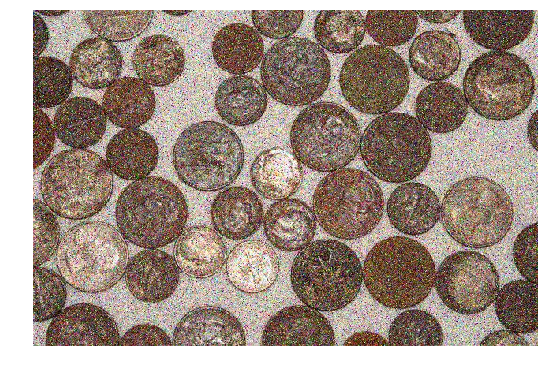

In [13]:
coins_noise = read_BGR('coins_noise_1.jpg')
show(coins_noise, size=7)

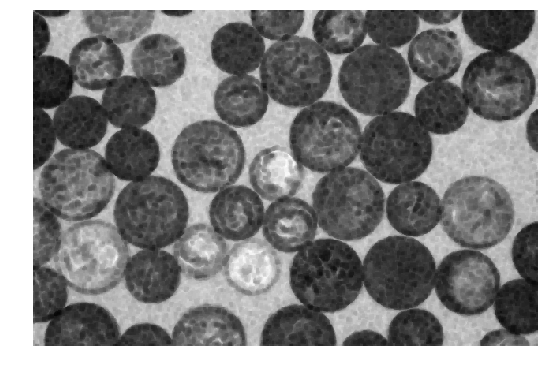

In [14]:
coins_blur = cv2.medianBlur(coins_noise, 5)
coins_gray = cv2.cvtColor(coins_blur, cv2.COLOR_RGB2GRAY)
coins_gray = cv2.erode(coins_gray, np.ones((3, 3), np.uint8))
show(coins_gray, size=7, cmap='gray')

In [15]:
coins = cv2.HoughCircles(coins_gray, 
                         method=cv2.HOUGH_GRADIENT, 
                         dp=1, 
                         minDist=60,
                         param1=85,
                         param2=13,
                         minRadius=33,
                         maxRadius=48)

coins = np.uint16(coins.squeeze())
coins = sorted(coins, key=circle_area)

Label 0:	count = 19	avg. area = 3839.69
Label 1:	count = 4	avg. area = 4477.55
Label 2:	count = 3	avg. area = 5111.37
Label 3:	count = 5	avg. area = 6027.46
Label 4:	count = 10	avg. area = 6676.83


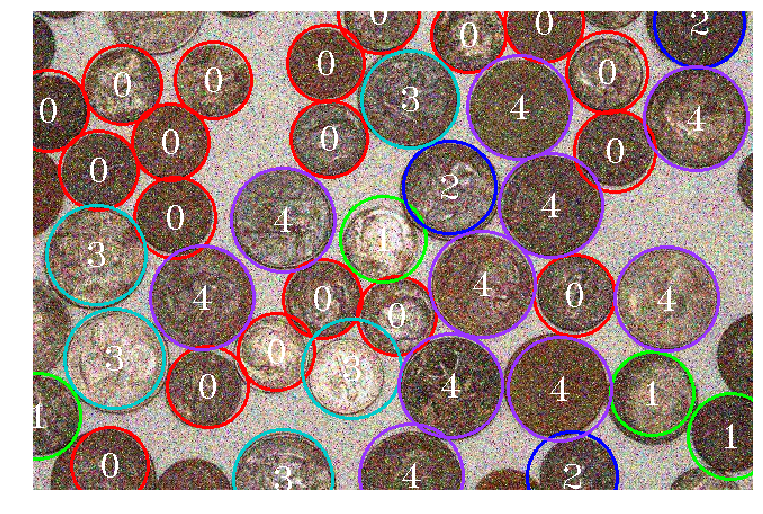

In [16]:
coins_labeled = analyze_coins(coins)
show(draw_coins(coins_noise, coins_labeled))

#### Image 2

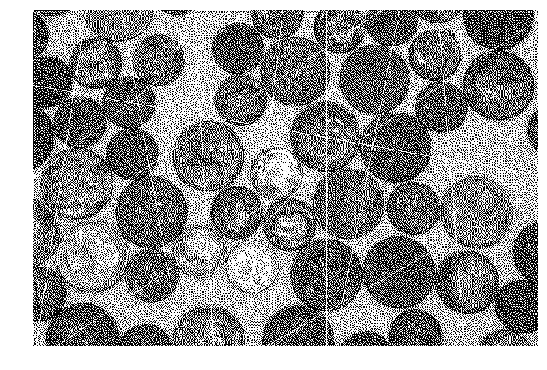

In [17]:
coins_noise = read_BGR('coins_noise_2.jpg')
show(coins_noise, size=7)

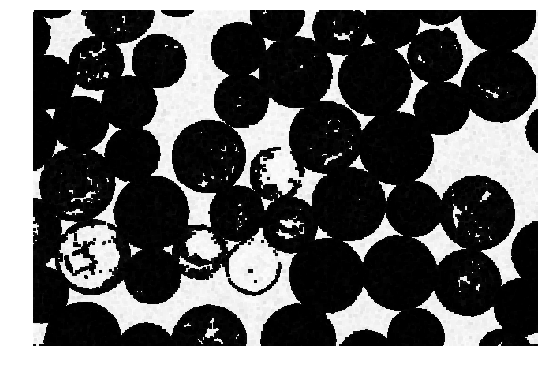

In [18]:
coins_blur = cv2.medianBlur(coins_noise, 3)
coins_gray = cv2.cvtColor(coins_blur, cv2.COLOR_RGB2GRAY)
coins_gray = cv2.erode(coins_gray, np.ones((4, 4), np.uint8))
show(coins_gray, size=7, cmap='gray')

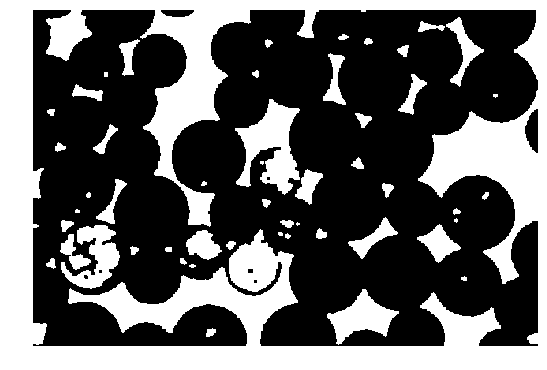

In [19]:
coins_bin = morph_open(coins_gray, kernel=(5, 5), threshold=120)
show(coins_bin, size=7, cmap='gray')

In [20]:
coins = cv2.HoughCircles(coins_bin, 
                         method=cv2.HOUGH_GRADIENT, 
                         dp=1.85, 
                         minDist=62,
                         param1=100,
                         param2=14,
                         minRadius=32,
                         maxRadius=51)

coins = np.uint16(coins.squeeze())
coins = sorted(coins, key=circle_area)

Label 0:	count = 12	avg. area = 3708.13
Label 1:	count = 8	avg. area = 4300.84
Label 2:	count = 9	avg. area = 5456.95
Label 3:	count = 1	avg. area = 6361.73
Label 4:	count = 8	avg. area = 7316.77


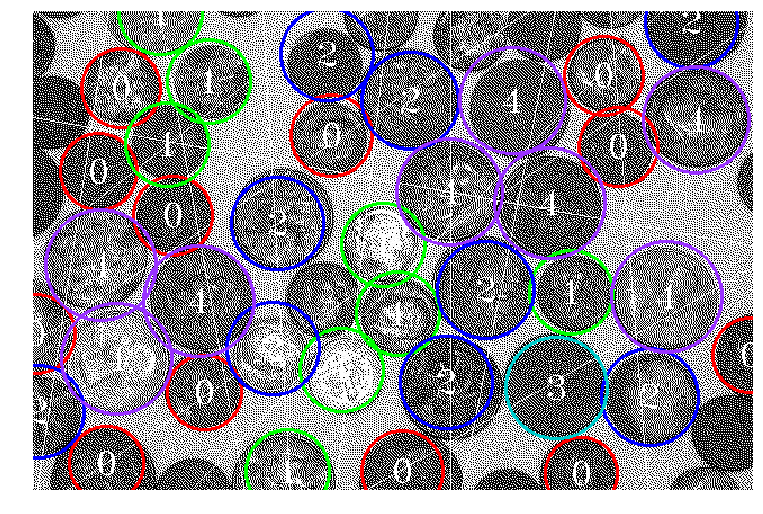

In [21]:
coins_labeled = analyze_coins(coins)
show(draw_coins(coins_noise, coins_labeled))

#### Image 3

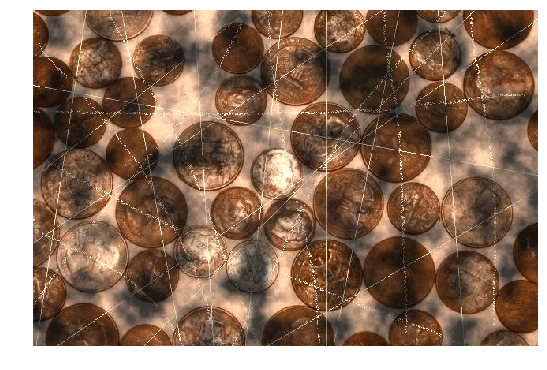

In [22]:
coins_noise = read_BGR('coins_noise_3.jpg')
show(coins_noise, size=7)

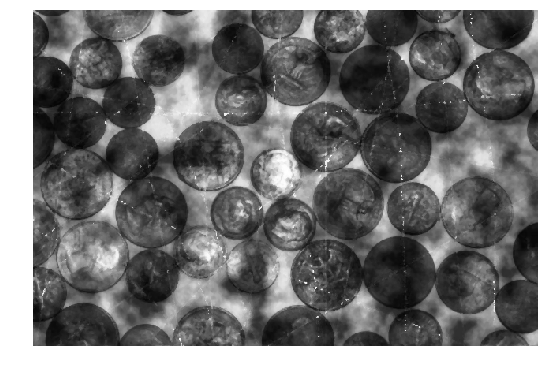

In [23]:
coins_blur = cv2.medianBlur(coins_noise, 3)
coins_gray = cv2.cvtColor(coins_blur, cv2.COLOR_RGB2GRAY)
show(coins_gray, size=7, cmap='gray')

In [24]:
coins = cv2.HoughCircles(coins_gray, 
                         method=cv2.HOUGH_GRADIENT, 
                         dp=1, 
                         minDist=64,
                         param1=83,
                         param2=22,
                         minRadius=30,
                         maxRadius=52)

coins = np.uint16(coins.squeeze())
coins = sorted(coins, key=circle_area)

Label 0:	count = 18	avg. area = 3177.90
Label 1:	count = 5	avg. area = 4030.66
Label 2:	count = 5	avg. area = 5437.47
Label 3:	count = 7	avg. area = 5926.84
Label 4:	count = 2	avg. area = 7241.37


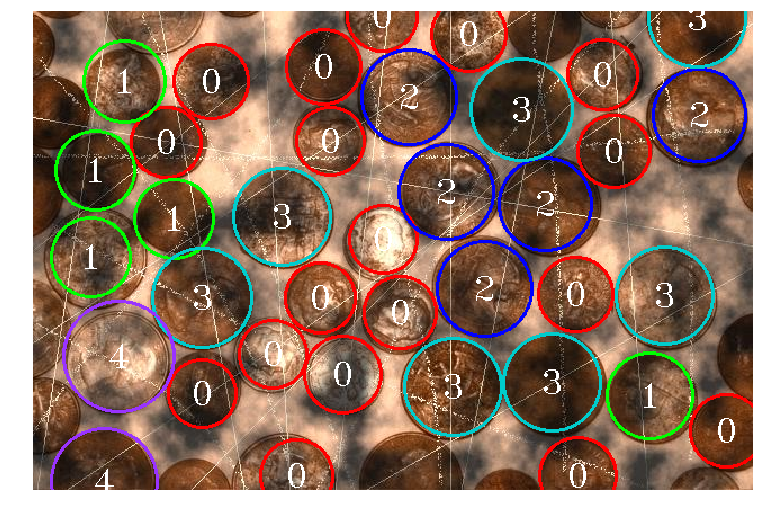

In [25]:
coins_labeled = analyze_coins(coins)
show(draw_coins(coins_noise, coins_labeled))

### Сравнение глобальных признаков 

Для задач 5 и 6 надо реализовать общую функцию, которая принимет на вход:

* список дескрипторов (**id**, и сам дескриптор) 
* количество максимально похожих для вывода **n**
* функцию сранения дескрипторов

и отдает **n** пар **id** максимально похожих изображений.

In [26]:
def find_nearest_pairs(images, n, comparator):
    return sorted(combinations(images, 2), key=lambda it: comparator(*it))[:n]

**5. (10 баллов)** Посмотрите на изображения в папке *Coral*. Посчитайте гистограммы изображений. Выведите на экран 20 пар изображений с максимально похожими гистограммами. В этом задании надо попробовать:
* различные цветовые пространства (RGB, HSV, CIELab)
* различные способы разбиения на бины (разное количество для каждой характеристики)
* различные метрики сравнения $L_2$, $\chi^2$, пересечение гистограм

In [27]:
def hist_diff(image_1, image_2, channel, bins_count, metric):
    hist_1 = cv2.calcHist([image_1], [channel], None, [bins_count], [0, 256])
    hist_2 = cv2.calcHist([image_2], [channel], None, [bins_count], [0, 256])
    return cv2.compareHist(hist_1, hist_2, metric)


def image_comparator(color_space, bins_count, metric):            
    def _get_distance(image_1, image_2):
        assert image_1.shape[2] == image_2.shape[2]
        
        if color_space is not None:
            image_1 = cv2.cvtColor(image_1, color_space)
            image_2 = cv2.cvtColor(image_2, color_space)
        
        channels_num = image_1.shape[2]
        diff = [hist_diff(image_1, image_2, i, bins_count[i], metric) for i in range(channels_num)]
        return np.mean(diff)
            
    return lambda image_1, image_2: _get_distance(image_1, image_2)

In [28]:
def draw_pairs(pairs, **kwargs):
    figs, axes = plt.subplots(ncols=2, nrows=len(pairs), figsize=(10, 4 * len(pairs)))
    
    for row, (image_1, image_2) in enumerate(pairs):
        ax0, ax1 = axes[row]

        ax0.set_axis_off()
        ax0.imshow(image_1, **kwargs)

        ax1.set_axis_off()
        ax1.imshow(image_2, **kwargs)

In [29]:
corel = Path('./datasets/Corel/')
images = [read_BGR(str(it)) for it in corel.glob('*.*')]

#### Пример 1

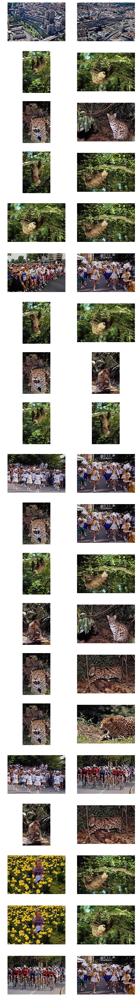

In [30]:
comparator = image_comparator(None, [256, 256, 256], cv2.HISTCMP_CHISQR)
nearest_images = find_nearest_pairs(images, 20, comparator)
draw_pairs(nearest_images)

#### Пример 2

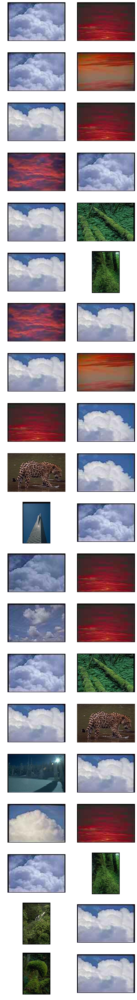

In [31]:
comparator = image_comparator(cv2.COLOR_RGB2HSV, [128, 128, 128], cv2.HISTCMP_INTERSECT)
nearest_images = find_nearest_pairs(images, 20, comparator)
draw_pairs(nearest_images)

#### Пример 3

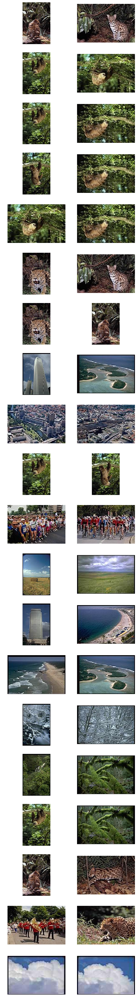

In [32]:
comparator = image_comparator(cv2.COLOR_RGB2LAB, [16, 16, 16], cv2.HISTCMP_BHATTACHARYYA)
nearest_images = find_nearest_pairs(images, 20, comparator)
draw_pairs(nearest_images)

**6. (10 баллов)** Посмотрите на изображения в папке *leaves*. Посчитайте дескрипторы Фурье для каждого листочка изображений. Выведите на экран 20 пар изображений с максимально похожими дескрипторами.

In [33]:
def descriptor(img):
    _, contours, hierarchy = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    
    points = contours[0].squeeze()
    points_complex = np.empty(shape=len(points), dtype=complex)
    points_complex.real = points[:, 0]
    points_complex.imag = points[:, 1]
    
    fft = np.fft.fftshift(np.fft.fft(points_complex))
    center = len(fft) // 2
    return np.fft.ifft(fft[center - 16 : center + 16])

In [34]:
leaves = Path('./datasets/leaves/')
images = [cv2.imread(str(it), 0) for it in leaves.glob('*.tif')]

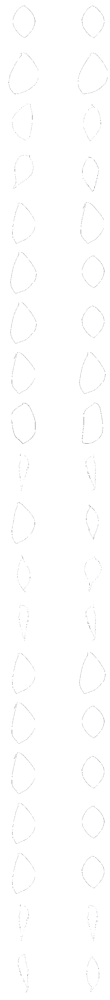

In [35]:
comparator = lambda image_1, image_2: distance.euclidean(descriptor(image_1), descriptor(image_2))
nearest_images = find_nearest_pairs(images, 20, comparator)
draw_pairs(nearest_images, cmap='gray')